# Project Title  :-
## Seoul Bikr SHaring Demand Prediction

## Problem Description 
Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.

Liberary loaded for manipulation loading and visualizing data 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv("SeoulBikeData.csv", encoding= "ISO-8859-1")

In [3]:
df =  data.copy()

### Data Description

In [4]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Rented Bike Count,8760.0,704.602055,644.997468,0.0,191.00,504.50,1065.25,3556.00
Hour,8760.0,11.500000,6.922582,0.0,5.75,11.50,17.25,23.00
Temperature(°C),8760.0,12.882922,11.944825,-17.8,3.50,13.70,22.50,39.40
Humidity(%),8760.0,58.226256,20.362413,0.0,42.00,57.00,74.00,98.00
Wind speed (m/s),8760.0,1.724909,1.036300,0.0,0.90,1.50,2.30,7.40
Visibility (10m),8760.0,1436.825799,608.298712,27.0,940.00,1698.00,2000.00,2000.00
Dew point temperature(°C),8760.0,4.073813,13.060369,-30.6,-4.70,5.10,14.80,27.20
Solar Radiation (MJ/m2),8760.0,0.569111,0.868746,0.0,0.00,0.01,0.93,3.52
Rainfall(mm),8760.0,0.148687,1.128193,0.0,0.00,0.00,0.00,35.00
Snowfall (cm),8760.0,0.075068,0.436746,0.0,0.00,0.00,0.00,8.80


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

From the above explanation we need to change the data type of date to datetime from object. 
To make sense of the data we gave to the model

In [6]:
df["Date"] = pd.to_datetime(df['Date'], format="%d/%m/%Y")

For the further explanation and visualization of data we split the date column in 3 parts. 
1. day_of_week
2. month
3. year

In [7]:
df['day_of_week'] = df['Date'].dt.day_name()
df['month'] = df['Date'].dt.month_name()
df['year'] = df['Date'].map(lambda x :x.year).astype("object")

In [8]:
df.drop(columns= ['Date'], inplace= True)

<p>Changing the hour data type so that moving further we can use categorical transformation on this.</p>
For now it is considered as numerical data and which is not right. As model could interrept the hour and consider 4 to be larger than 3 which is not right in term of hour as increase in sales have no such relation as the bigger the hour the more sales

In [9]:
df['Hour'] = df['Hour'].astype("object")

Divide the dataset into 2 category 
1. numerical_f :- numerical features containing numerical data
2. categorical_f := categorical features containing dataset that will be transformed 

In [10]:
numeric_f = df.select_dtypes(exclude='object')
categorical_f = df.select_dtypes(include='object')

Now the categorical features contains these columns we can see some charts and graphs to better understand the data

In [11]:
categorical_f.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Hour             8760 non-null   object
 1   Seasons          8760 non-null   object
 2   Holiday          8760 non-null   object
 3   Functioning Day  8760 non-null   object
 4   day_of_week      8760 non-null   object
 5   month            8760 non-null   object
 6   year             8760 non-null   object
dtypes: object(7)
memory usage: 479.2+ KB


<p>We create pointplot for the hour and rented bike count</p>
And the data set is visualized based on the columns in the categorical features 

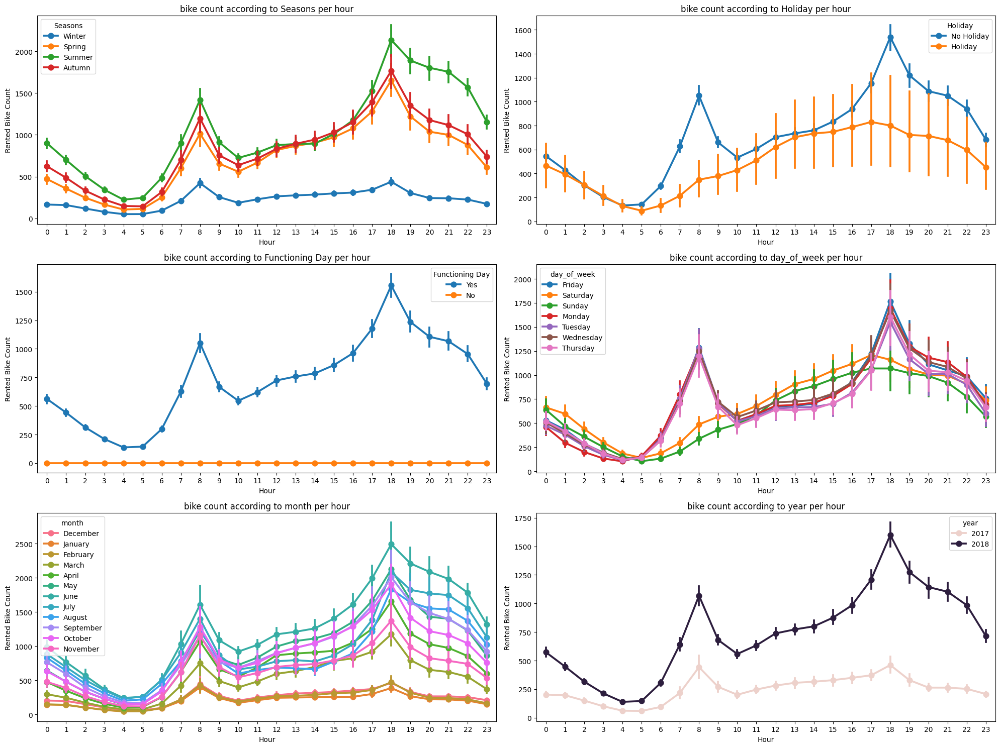

In [12]:
n = 1
plt.figure(figsize= (20, 15) )
for i in categorical_f.columns:
    if i != 'Hour':
        plt.subplot(3,2,n)
        n += 1
        sns.pointplot(x=df['Hour'], y=df['Rented Bike Count'],  hue= df[i])
        plt.title(f"bike count according to {i} per hour")
        plt.tight_layout()

<b>OBSERVATION :-</b>
<p>Accoring to <b>Seasons</b> winter has lowest sale </p>
<p><b>Holiday</b> :- sales were low on holidays </p>
<p><b>Non_functioning</b> day have low sales or rather none sales </p>
<p><b>Day of week</b> :- although it may seen overall same but there is one particular thing that during working /office timing the sales are higher than weekends but in between office timing the sales are higher for the weekends</p>
<p><b>month</b> :- jan and dec has lowest sales while during summer sales were higher</p>
<b>year</b> :- 2018 sat huge sale growth

In [13]:

df['week'] = df['day_of_week'].apply(lambda x:'Weekend'  if x=='Saturday' or  x== 'Sunday' else 'Weekdays')

As we saw in the above pointplot the days are more correlated in weekends and weekdays rather than the single day</p>
so we should split the <b>week</b> coulumns in <b>weekends</b> and <b>weekdays</b> </p>
lets see if our hypothesis is correct 

Text(0.5, 1.0, 'rental bike counr during weekend and weekdays with hour')

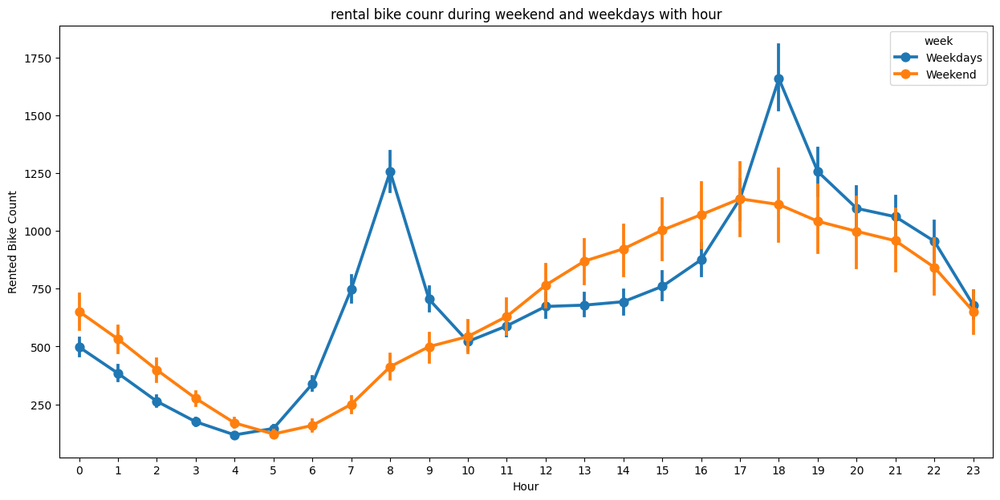

In [14]:
plt.figure(figsize=(15,7))
sns.pointplot(x=df['Hour'] , y=df['Rented Bike Count'], hue=df['week'])
plt.title('rental bike counr during weekend and weekdays with hour')
          

We converted <b>week</b> data in <b>weekends</b> adn <b> weekdays</b> data and as expected it describe data much better then week 

In [15]:
df.drop(columns=['day_of_week'], inplace=True)
categorical_f.drop(columns=['day_of_week'], inplace=True)

Creating boxplots and barplots to get the idea of data and their contribution in sales

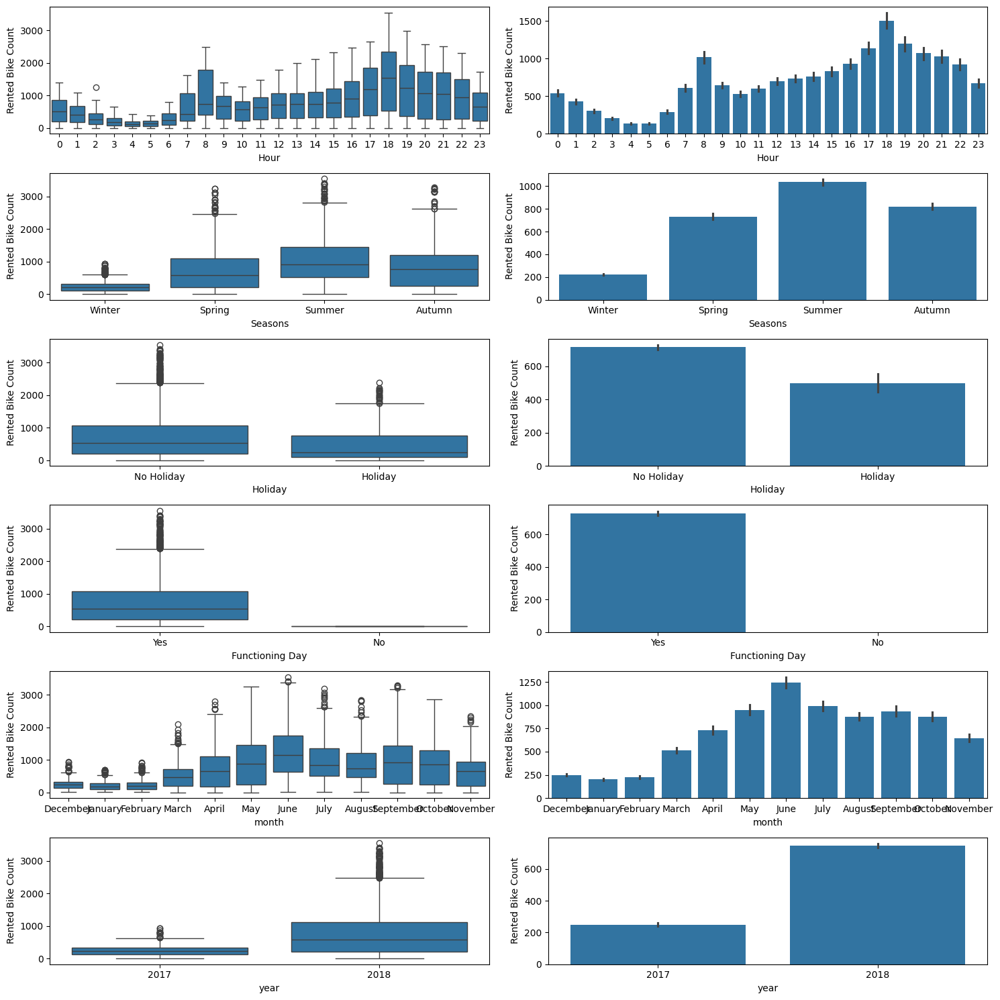

In [16]:
n = 1
plt.figure(figsize=(15,15))
for i in categorical_f.columns:
    plt.subplot(6, 2, n)
    n += 1
    sns.boxplot(x=df[i], y=df['Rented Bike Count'])
    plt.subplot(6, 2, n)
    n += 1
    sns.barplot(x=df[i], y= df['Rented Bike Count'])
    plt.tight_layout()

Create a Pieplot to get the idea of contribution of category in differrent aspects 

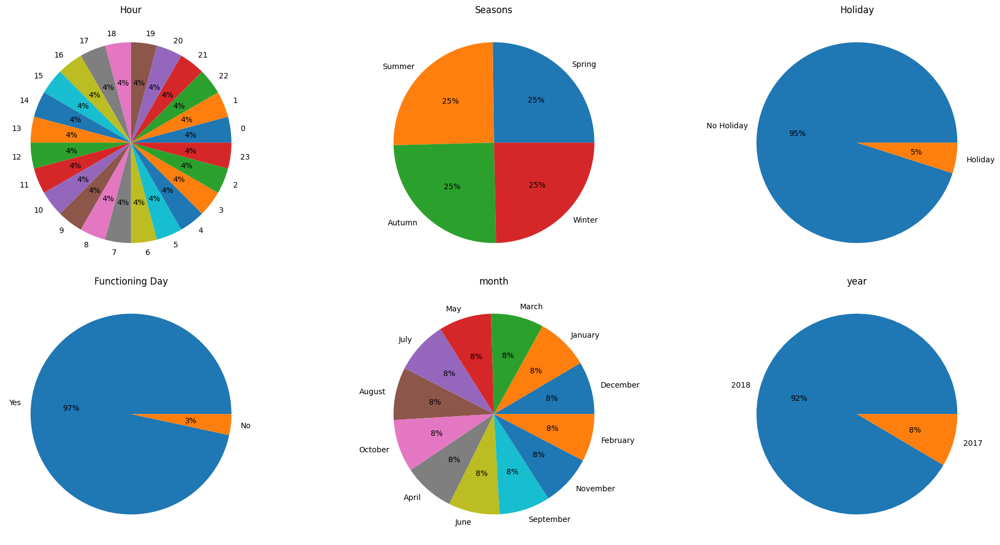

In [17]:
n = 1
plt.figure(figsize=(20, 15))
for i in categorical_f.columns:
    plt.subplot(3, 3, n)
    n += 1
    plt.pie(df[i].value_counts(), labels= df[i].value_counts().keys().tolist(), autopct='%.0f%%')
    plt.title(i)
    plt.tight_layout()

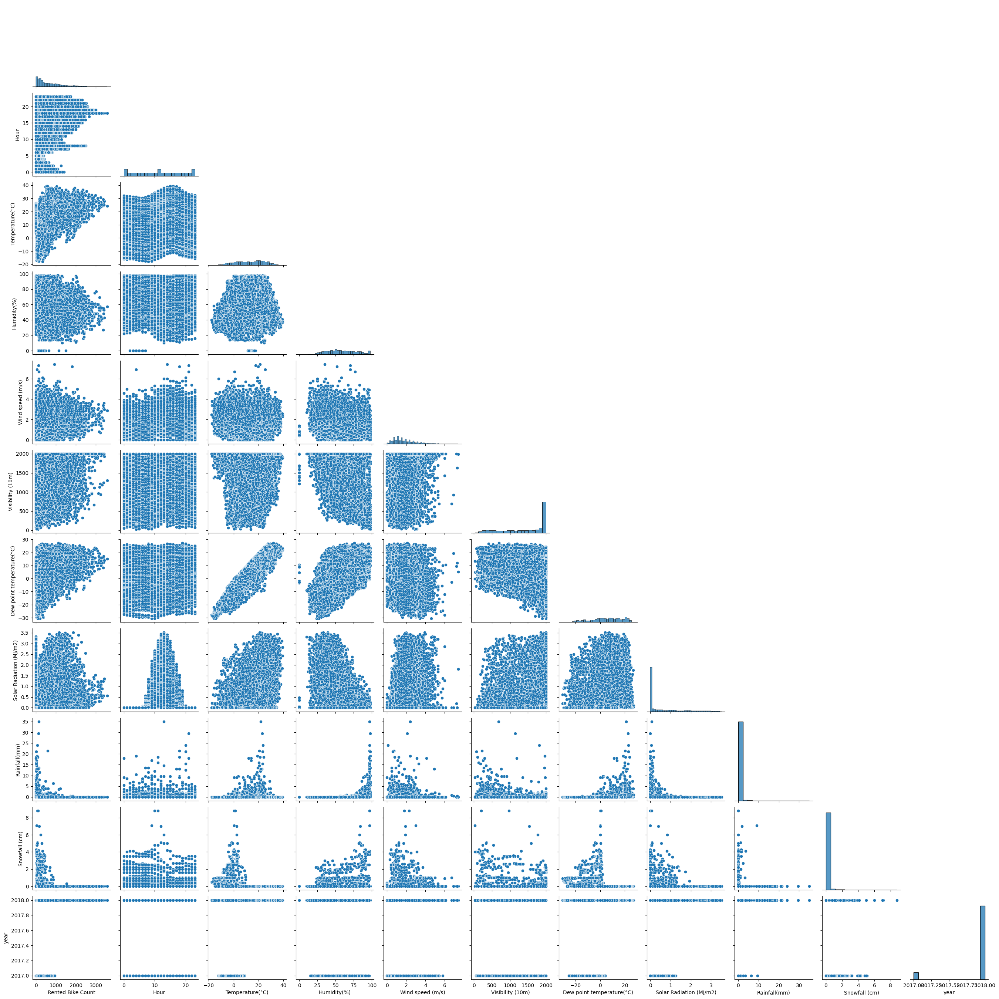

In [18]:
sns.pairplot(df, corner=True)

Check for the outliars in the numerical data using boxplots

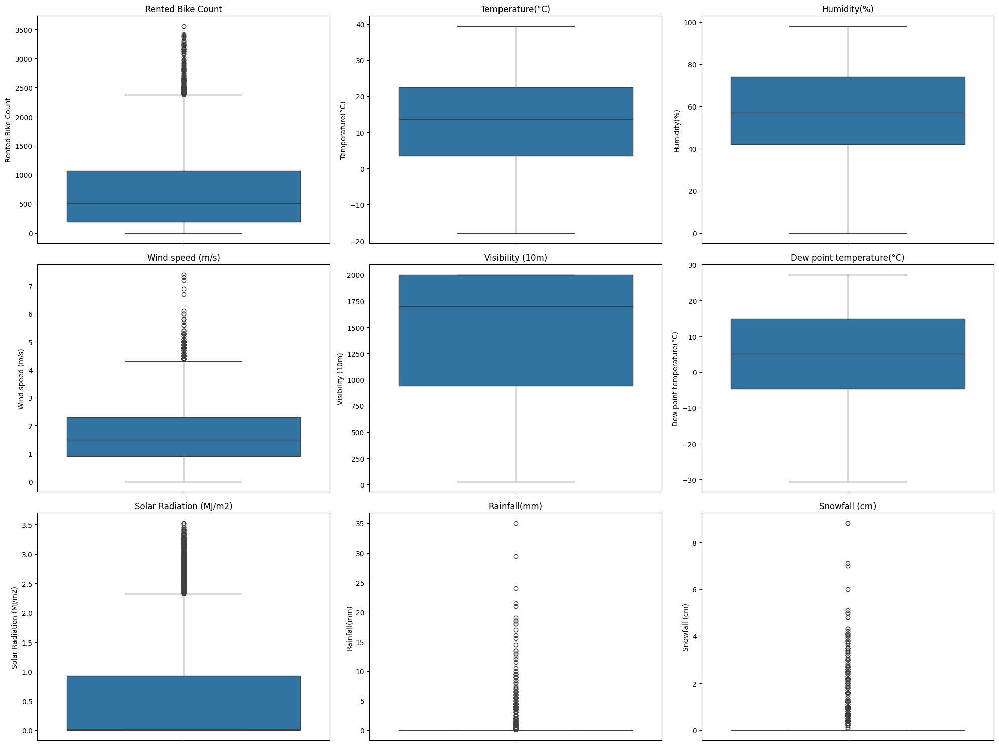

In [19]:
n = 1
plt.figure(figsize=(20, 15))
for i in numeric_f.columns:
    plt.subplot(3, 3, n)
    n += 1
    sns.boxplot(df[i])
    plt.title(i)
    plt.tight_layout()

We don't have to worry about outliers in this data, because When we are treating the outlires from Rainfall and snowfall columns using IQR its removed all the information of the data and all values became 0

In [20]:
numeric_f.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   int64  
 1   Temperature(°C)            8760 non-null   float64
 2   Humidity(%)                8760 non-null   int64  
 3   Wind speed (m/s)           8760 non-null   float64
 4   Visibility (10m)           8760 non-null   int64  
 5   Dew point temperature(°C)  8760 non-null   float64
 6   Solar Radiation (MJ/m2)    8760 non-null   float64
 7   Rainfall(mm)               8760 non-null   float64
 8   Snowfall (cm)              8760 non-null   float64
dtypes: float64(6), int64(3)
memory usage: 616.1 KB


Lets see the skewness in the data using distplot and histplot</p>
using histplot we also find the mean and median of the data to see can we make data distributed using mean or median

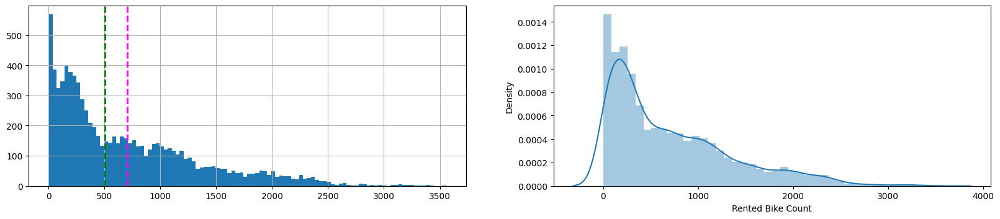

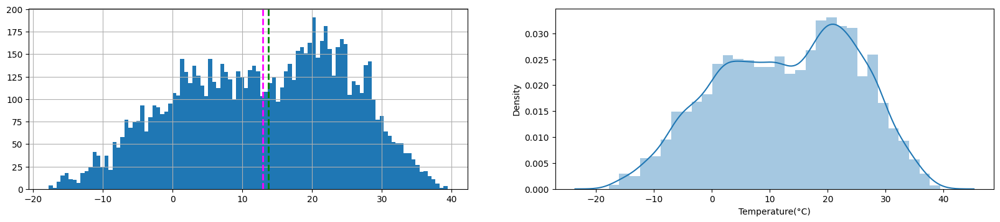

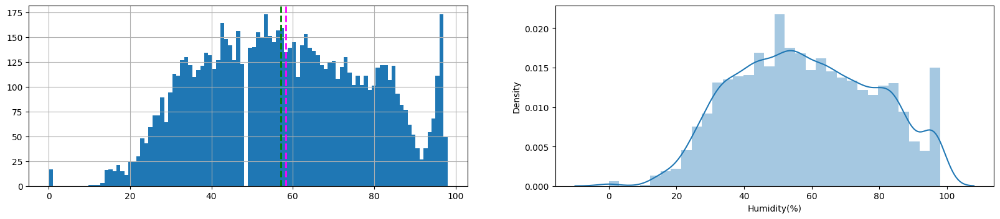

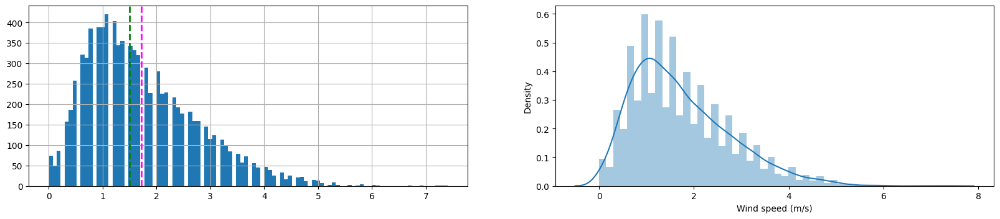

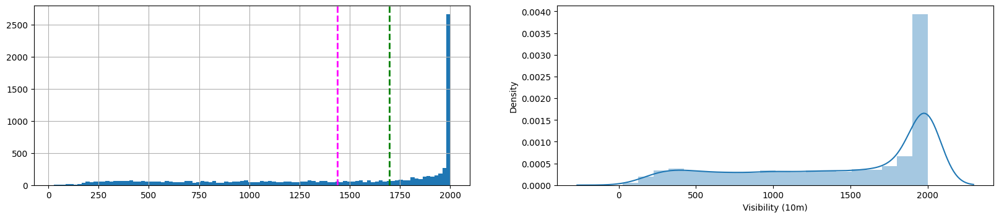

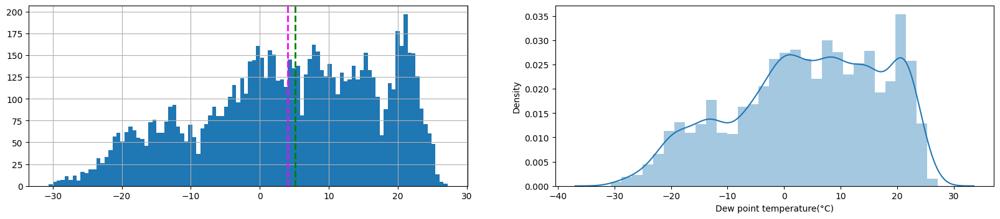

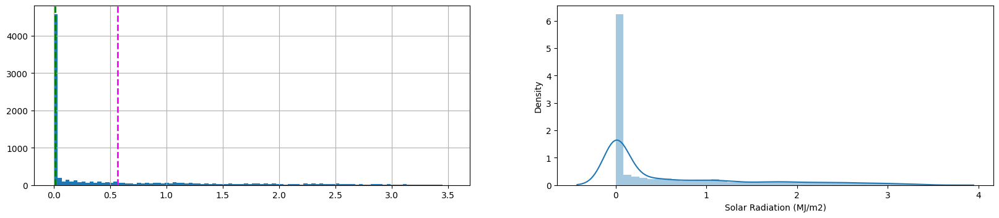

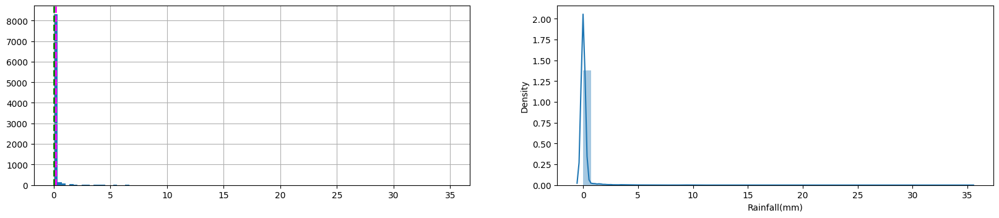

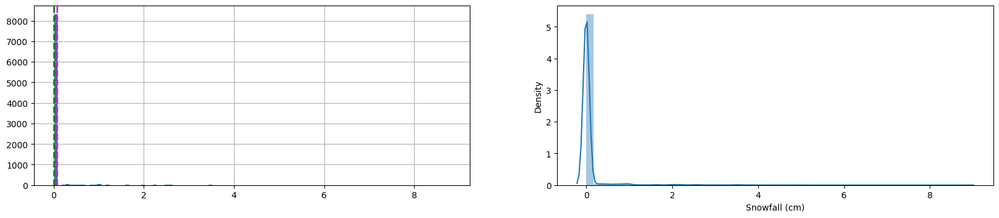

In [21]:
n = 1
for i in numeric_f.columns:
    plt.figure(figsize=(20, 40))
    plt.subplot(9,2, n)
    n +=1
    df[i].hist(bins=100)
    plt.axvline(df[i].mean(), color='magenta', linestyle= '--', linewidth=2)
    plt.axvline(df[i].median(), color='green', linestyle= '--', linewidth=2)
    plt.subplot(9, 2, n)
    n += 1
    sns.distplot(df[i])
    plt.show()

In Distplot plots we observe that some of our columns is right skewed and some are left skewed we have to remember this things when we apply algorithms

Right skewed columns are

Rented Bike Count (Its also our Dependent variable), Wind speed (m/s), Solar Radiation (MJ/m2), Rainfall(mm), Snowfall (cm),

Left skewed columns are

Visibility (10m), Dew point temperature(°C)

From Histogram we are coming to know that the features which are skewed, their mean and the median are also skewed, which was understood by looking at the graph that this would happen

Lets see how dependable varibale is correlated with our numerical features

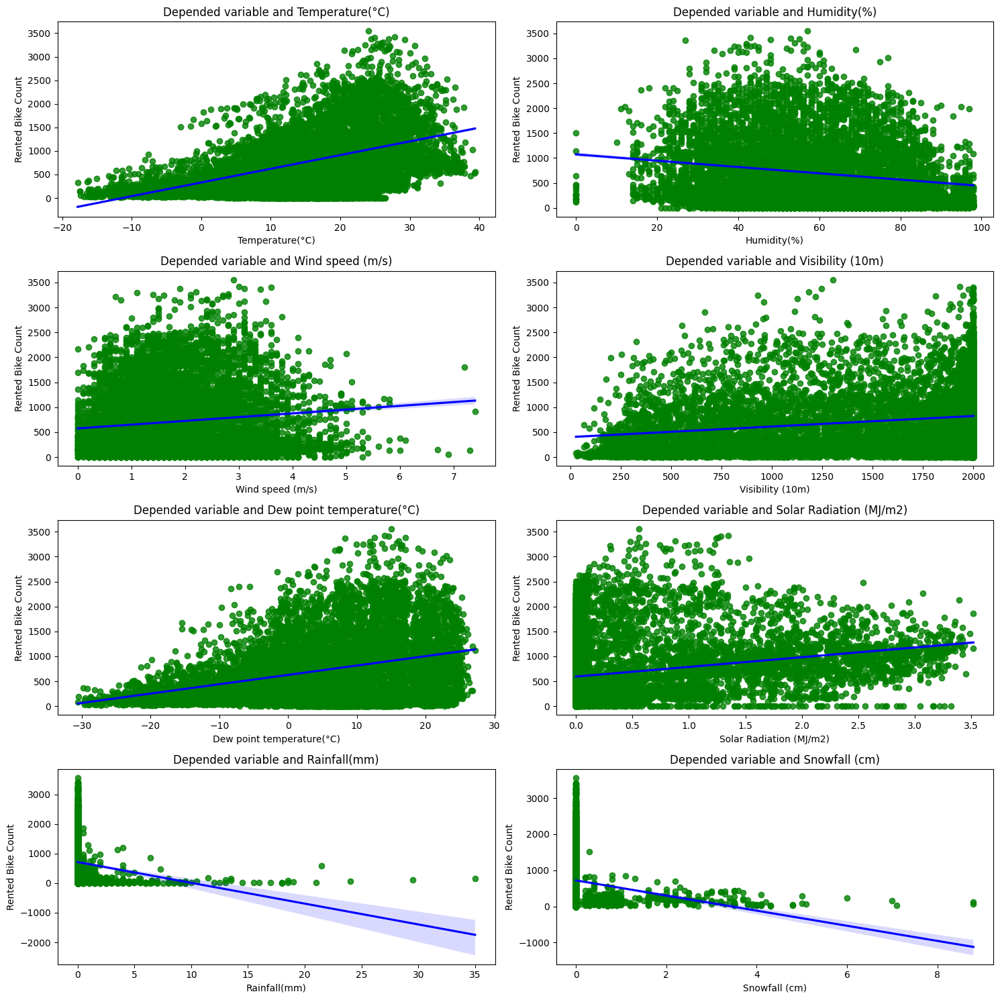

In [22]:
n = 1
plt.figure(figsize=(15, 15))
for i in numeric_f.columns:
    if i != 'Rented Bike Count':
        plt.subplot(4, 2, n)
        n += 1
        sns.regplot(data= df, x=i, y= 'Rented Bike Count', scatter_kws= {"color": "green"}, line_kws={"color": "blue"})
        plt.title(f'Depended variable and {i}')
        plt.tight_layout()

Some variables are negative correlated and some are positive 

Lets see in more detail using <b>corr</b>

<Axes: >

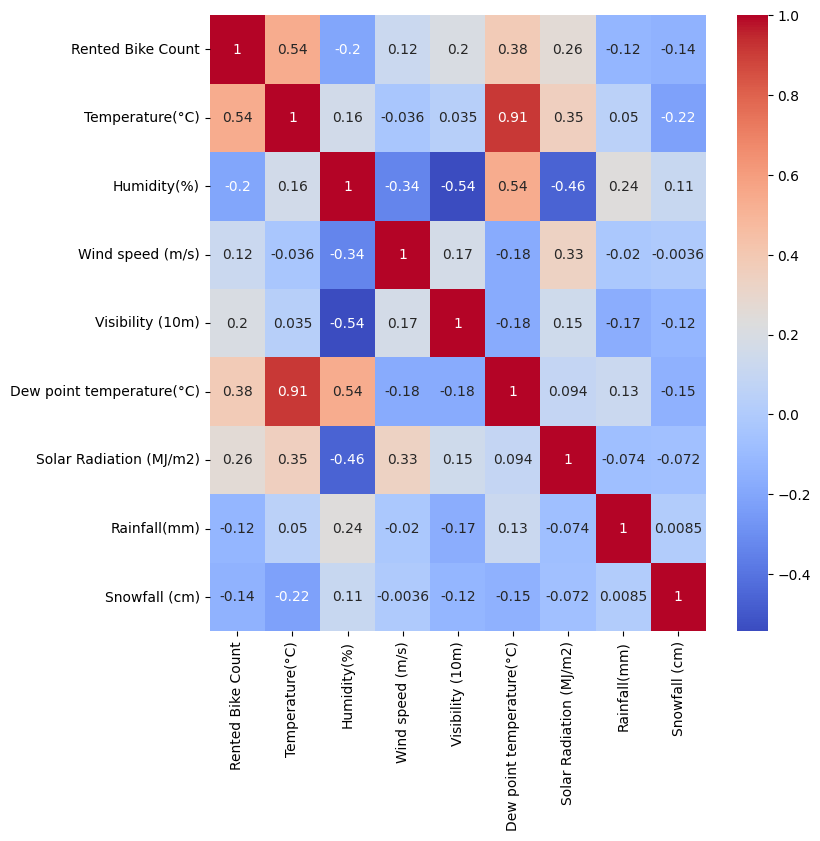

In [23]:
plt.figure(figsize=(8,8))
sns.heatmap(numeric_f.corr(), cmap='coolwarm', annot=True)

From this graph we are able to see that there is multicollinearity in temp and dew point temp

In [24]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def cal_vif(X):
    vif = pd.DataFrame()
    vif['variables'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif

In [25]:
cal_vif(df[[i for i in df.describe().columns if i not in ['Rented Bike Count','Dew point temperature(°C)']]])

,variables,VIF
0,Temperature(°C),3.166007
1,Humidity(%),4.758651
2,Wind speed (m/s),4.079926
3,Visibility (10m),4.409448
4,Solar Radiation (MJ/m2),2.246238
5,Rainfall(mm),1.078501
6,Snowfall (cm),1.118901


### prepare data for model training
encoding categorical features using get Dummies

In [26]:
pt = pd.get_dummies(df, drop_first=True, sparse=True, dtype= int)

In [27]:
pt.head()

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Hour_1,...,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September,year_2018,week_Weekend
0,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
1,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,1,...,0,0,0,0,0,0,0,0,0,0
2,173,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
3,107,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
4,78,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0


As we saw our dependable variable are right skewed we can use different ways to make the skewness just right

Text(0.5, 1.0, 'Square root')

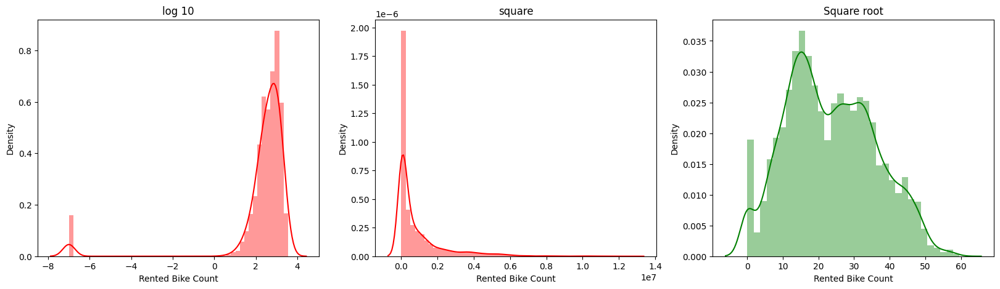

In [28]:
fig,axes = plt.subplots(1,3,figsize=(20,5))
# here we use log10 
sns.distplot(np.log10(pt['Rented Bike Count']+0.0000001),ax=axes[0],color='red').set_title("log 10")
# here we use square 
sns.distplot((pt['Rented Bike Count']**2),ax=axes[1],color='red').set_title("square")
# here we use square root 
sns.distplot(np.sqrt(pt['Rented Bike Count']),ax=axes[2], color='green').set_title("Square root")

Normalizing using square root seems rigt so we will go with square root on our dependable variable

In [29]:
X = pt.drop(columns=['Rented Bike Count','Dew point temperature(°C)'])
y = np.sqrt(pt['Rented Bike Count'])

In [30]:
from sklearn.model_selection import train_test_split

Splitting the data 

In [31]:
x_train,x_test,y_train,y_test = train_test_split(X,y, test_size=0.25,random_state=42)

In [32]:
# Appending all models evalution scores to the corrosponding list after hyperarameter
mean_absolut_error_ht = []
mean_sq_error_ht=[]
root_mean_sq_error_ht=[]
training_score_ht =[]
r2_list_ht=[]
adj_r2_list_ht=[]

# creating a function for fit, predict and evaluting the models and append all evalution score in list 

def score_metrix (model,X_train,X_test,Y_train,Y_test, linear = False):

  '''
    train the model and gives mae, mse,rmse,r2,adj r2 score of the model
    
  '''
  #training the model
  model.fit(X_train,Y_train)

  # Training Score
  training  = model.score(X_train,Y_train)
  print('*'*30, 'Training score', '*'*30)
  print("Training score  =", training)

  print('\n')

  try:
      # finding the best parameters of the model if any 
    print('*'*20, 'Best Parameters & Best Score', '*'*20)
    print(f"The best parameters found out to be :{model.best_params_} \nwhere model best score is:  {model.best_score_} \n")
  except:
    print('None')
    
    

  #predicting the Test set and evaluting the models 
  print('\n')
  print('*'*20, 'Evalution Matrix', '*'*20)

  if linear == True:
    Y_pred = model.predict(X_test)

    #finding mean_absolute_error
    MAE  = mean_absolute_error(Y_test**2,Y_pred**2)
    print("MAE :" , MAE)

    #finding mean_squared_error
    MSE  = mean_squared_error(Y_test**2,Y_pred**2)
    print("MSE :" , MSE)

    #finding root mean squared error
    RMSE = np.sqrt(MSE)
    print("RMSE :" ,RMSE)

    #finding the r2 score
    
    r2 = r2_score(Y_test**2,Y_pred**2)
    print("R2 :" ,r2)
    #finding the adjusted r2 score
    adj_r2=1-(1-r2_score(Y_test**2,Y_pred**2))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
    print("Adjusted R2 : ",adj_r2,'\n')
  
  else:
    # for tree base models
    Y_pred = model.predict(X_test)

    #finding mean_absolute_error
    MAE  = mean_absolute_error(Y_test,Y_pred)
    print("MAE :" , MAE)

    #finding mean_squared_error
    MSE  = mean_squared_error(Y_test,Y_pred)
    print("MSE :" , MSE)

    #finding root mean squared error
    RMSE = np.sqrt(MSE)
    print("RMSE :" ,RMSE)

    #finding the r2 score
    
    r2 = r2_score(Y_test,Y_pred)
    print("R2 :" ,r2)
    #finding the adjusted r2 score
    adj_r2=1-(1-r2_score(Y_test,Y_pred))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
    print("Adjusted R2 : ",adj_r2,'\n')

    #Top 10 feature importance graph
    try:
      best = model.best_estimator_
      features = new_X.columns
      importances = best.feature_importances_[0:10]
      indices = np.argsort(importances)
      plt.figure(figsize=(10,15))
      plt.title('Feature Importance')
      plt.barh(range(len(indices)), importances[indices], color='pink',edgecolor='red' ,align='center')
      plt.yticks(range(len(indices)), [features[i] for i in indices])
      plt.xlabel('Relative Importance')
      plt.show()
    
    except:
      pass
  
  # Here we appending the parameters for all models 
  mean_absolut_error_ht.append(MAE)
  mean_sq_error_ht.append(MSE)
  root_mean_sq_error_ht.append(RMSE)
  training_score_ht.append(training)
  r2_list_ht.append(r2)
  adj_r2_list_ht.append(adj_r2)

  
  # print the cofficient and intercept of which model have these parameters and else we just pass them
  if model == Linear:
    print("*"*25, "coefficient", "*"*25)
    print(model.coef_)
    print('\n')
    print("*"*25, "Intercept", "*"*25)
    print('\n')
    print(model.intercept_)
  else:
    pass
  print('\n')
  
  print('*'*20, 'ploting the graph of Actual and predicted only with 80 observation', '*'*20)

  # ploting the graph of Actual and predicted only with 80 observation for better visualisation which model have these parameters and else we just pass them
  try:
    # ploting the line graph of actual and predicted values  
    plt.figure(figsize=(15,7))
    plt.plot((Y_pred)[:80])
    plt.plot((np.array(Y_test)[:80]))
    plt.legend(["Predicted","Actual"])
    plt.show()
  except:
    pass



Lime tabular is imported to get the explanation of the model

In [33]:
from lime import lime_tabular

We First use the lime_tabular to explain prediction on tabular data</p>
You can call the explain_instance function of the explainer object to explain the prediction. The following parameters are required

In [34]:

def model_explainability_lime(model,num_features,row_number):
  test = pd.DataFrame(x_test)
  lime_explainer = lime_tabular.LimeTabularExplainer(
      training_data = x_train_scale,
      feature_names = new_x.columns.values,
      mode = 'regression',
      verbose=True,
      random_state =42 )

  lime_exp = lime_explainer.explain_instance(
      data_row = x_test.iloc[row_number],
      predict_fn = model.predict,num_features=num_features,
  )
  return lime_exp.show_in_notebook(show_table=True,)

With SHAP, we can generate explanations for a single prediction. The SHAP plot shows features that contribute to pushing the output from the base value (average model output) to the actual predicted value.

Red color indicates features that are pushing the prediction higher, and blue color indicates just the opposite.

In [35]:
import shap

In [36]:
def model_explainability_shap(model,for_instance):
  # Initialize JavaScript visualizations in notebook environment
  shap.initjs()
  # Define a tree explainer for the built model
  explainer = shap.TreeExplainer(model)
  # obtain shap values for the first row of the test data
  shap_values = explainer(x_test,check_additivity=False)
  # visualize the first prediction's explanation with a force plot
  return shap.plots.force(shap_values[for_instance])

<b>Powertransformer</b> is used to make the data more realiable and to resolve the issue of skewness in data

In [37]:
from sklearn.preprocessing import PowerTransformer, MinMaxScaler

In [38]:
pr = PowerTransformer()
x_train_trans = pr.fit_transform(x_train) # fit transform the training set
x_test_trans = pr.transform(x_test) #tranform the test set

Importing all linear models and the scoring modules  

In [39]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge, SGDRegressor

In [40]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

All linear module score without hyperparameter tuning

In [41]:
mean_absolut_error = []
mean_sq_error=[]
root_mean_sq_error=[]
training_score =[]
r2_list=[]
adj_r2_list=[]

# assigning models in variables
lr= LinearRegression()
l2 = Ridge()
l1 = Lasso()
sgd = SGDRegressor()


linear_models = [lr,l1,l2,sgd]
for i in linear_models:
  i.fit(x_train_trans,y_train)
  y_pred = i.predict(x_test_trans)
  mae = mean_absolute_error(y_test,y_pred)
  print(mae)
  mse = mean_squared_error(y_test,y_pred)
  rmse = np.sqrt(mse)
  r2 = r2_score(y_test,y_pred)
  ad_r2 =1-(1-r2)*((x_test_trans.shape[0]-1)/(x_test_trans.shape[0]-x_test_trans.shape[1]-1))

  training_score.append(i.score(x_train_trans,y_train))
  mean_absolut_error.append(mae)
  mean_sq_error.append(mse)
  root_mean_sq_error.append(rmse)
  r2_list.append(r2)
  adj_r2_list.append(ad_r2)


4.0797476657604355
5.453423127601934
4.044736234634306
4.0492094022608285


Now we have seen all the linear modules without hyperparameter now we can see with hyperparameter 

### Linear Regression with hyperparameter tuning

In [42]:
Linear = LinearRegression()

****************************** Training score ******************************
Training score  = 0.8075643028027502


******************** Best Parameters & Best Score ********************
None


******************** Evalution Matrix ********************
MAE : 196.9485676454761
MSE : 82327.58223661665
RMSE : 286.92783454488455
R2 : 0.798808933463347
Adjusted R2 :  0.7942983443957341 

************************* coefficient *************************
[ 4.88218712e+00 -1.27127604e+00 -2.71552229e-02  3.90800246e-01
  2.93779858e+00 -2.97477963e+00 -2.95582918e-02 -5.18067132e-01
 -1.13531849e+00 -1.62524707e+00 -1.99902466e+00 -1.91330499e+00
 -8.93766138e-01  2.87909653e-02  9.01215950e-01 -3.72581638e-01
 -1.44086684e+00 -1.55482102e+00 -1.38843700e+00 -1.34014891e+00
 -1.04476521e+00 -1.07840476e+00 -6.36929146e-01  4.32328712e-01
  1.77165338e+00  1.36106402e+00  1.12633005e+00  1.50149538e+00
  1.01210435e+00  4.09957706e-01  7.05784326e+13 -4.88518797e+13
 -7.57898199e+13  6.55773326e-

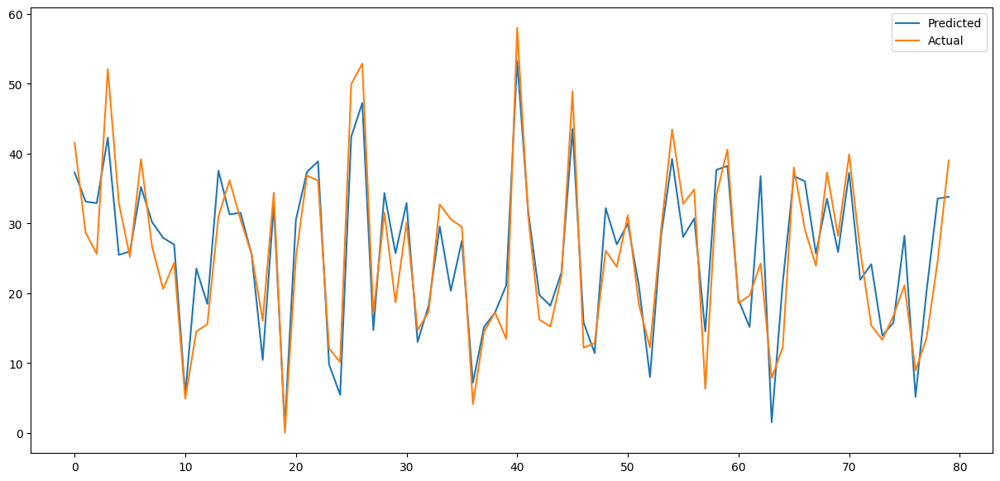

In [43]:
score_metrix(Linear, x_train_trans, x_test_trans, y_train, y_test, linear=True)

### Lassso with hyperparameter tuning

In [44]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [45]:
parameters= {'alpha' : [1e-15, 1e-13, 1e-10, 1e-5, 1e-4, 1e-2, 1e-1, 1, 5, 10, 20, 30, 40 , 50, 60, 100, 0.0014]}
L1 = GridSearchCV(Lasso(), parameters, cv=5)

****************************** Training score ******************************
Training score  = 0.8090555455823615


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'alpha': 0.0014} 
where model best score is:  0.8057077152228864 



******************** Evalution Matrix ********************
MAE : 195.79664827959766
MSE : 82170.42846443261
RMSE : 286.6538478102686
R2 : 0.7991929837922526
Adjusted R2 :  0.7946910049141713 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


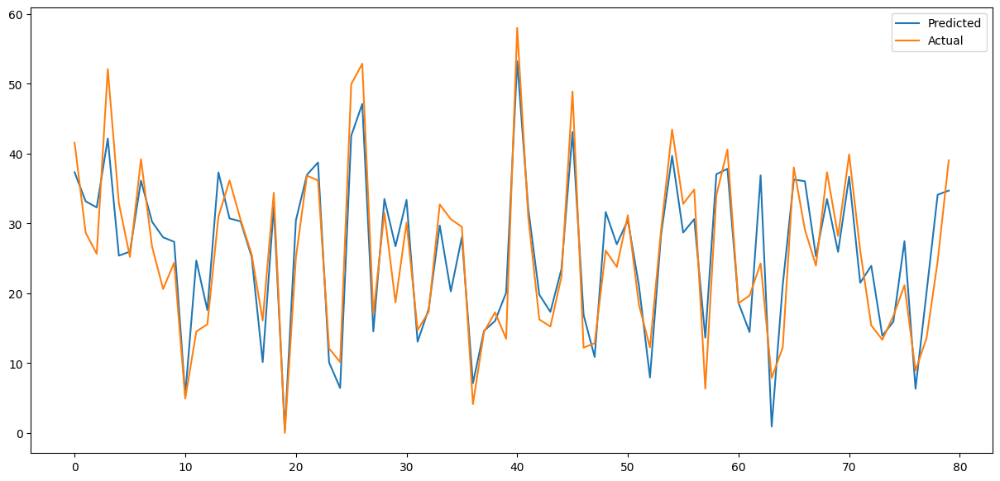

In [46]:
score_metrix(L1, x_train_trans, x_test_trans, y_train, y_test, linear=True)

### Ridge with hyperparameter tuning

In [47]:
parameters= {'alpha' : [1e-15, 1e-13, 1e-10, 1e-5, 1e-4, 1e-2, 1e-1, 1, 5, 10, 20, 30, 40 , 50, 60, 100, 0.0014]}
R1 = GridSearchCV(Ridge(), parameters,scoring='r2', cv=5)

****************************** Training score ******************************
Training score  = 0.8090573996079546


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'alpha': 1} 
where model best score is:  0.8057029028840663 



******************** Evalution Matrix ********************
MAE : 195.74506477932243
MSE : 82098.66736362371
RMSE : 286.52865016194056
R2 : 0.7993683526299538
Adjusted R2 :  0.7948703054212839 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


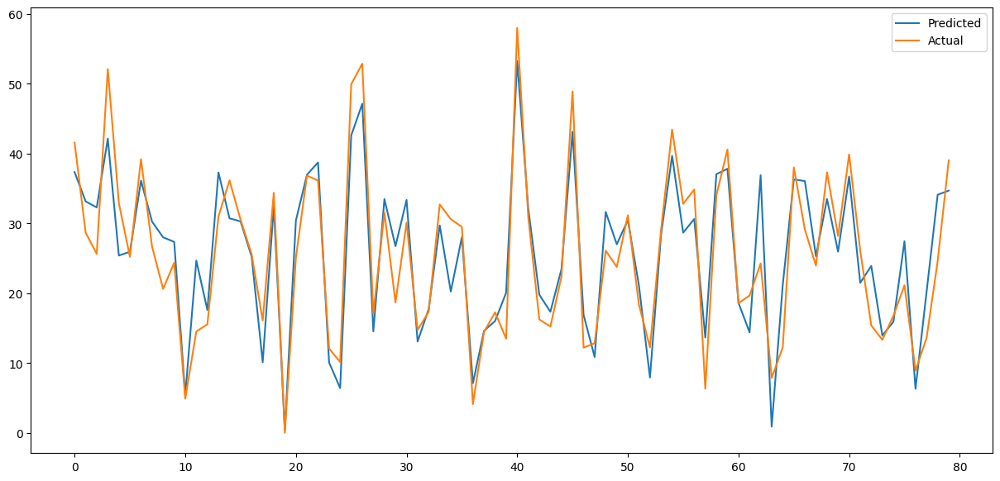

In [48]:
score_metrix(R1, x_train_trans, x_test_trans, y_train, y_test, linear=True)

### Polynomial with hyperparameter tuning

In [49]:
from sklearn.preprocessing import PolynomialFeatures

In [50]:
pol = PolynomialFeatures(2)
pol_x_train = pol.fit_transform(x_train_trans)
pol_x_test_train = pol.fit_transform(x_test_trans)

****************************** Training score ******************************
Training score  = 0.942911681793017


******************** Best Parameters & Best Score ********************
None


******************** Evalution Matrix ********************
MAE : 107.89713550256268
MSE : 32435.153843650623
RMSE : 180.09762309272887
R2 : 0.9207353961114859
Adjusted R2 :  0.8200101473942352 

************************* coefficient *************************
[ 7.22205351e+08  1.78593328e+00 -1.53863703e+00 ...  3.30985473e+12
 -4.36350224e+11  1.54744694e+12]


************************* Intercept *************************


3087118509341.2124


******************** ploting the graph of Actual and predicted only with 80 observation ********************


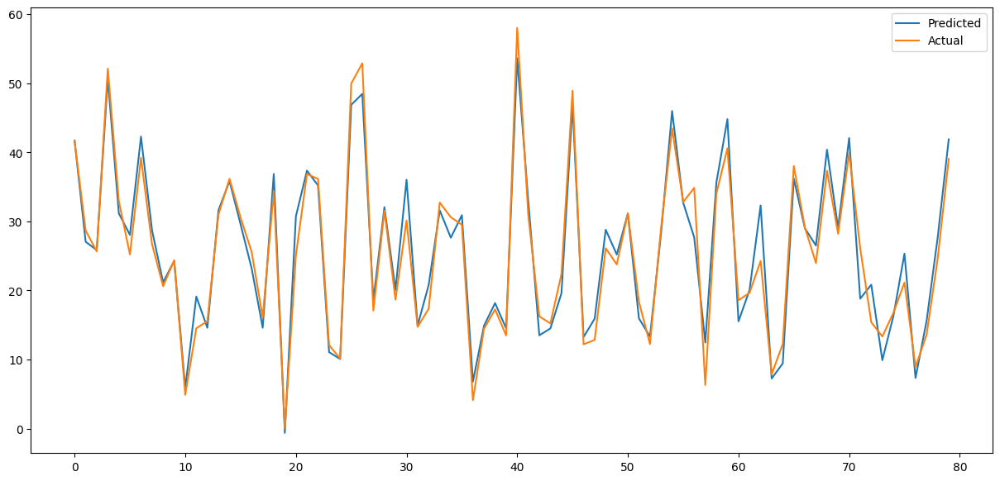

In [51]:
score_metrix(Linear, pol_x_train, pol_x_test_train, y_train, y_test, linear=True)

### SGDRegressor with hyperparameter tuning

In [52]:
params = {'penalty':['12', '11', 'elasticnet'], 'alpha':[0.01, 0.0001, 0.1],
    'max_iter':[1000, 800, 1200], 'learning_rate':['constant', 'optimal', 'invscaling']}

In [53]:
sgd_g = GridSearchCV(SGDRegressor(), param_grid= params, cv=2, verbose=True)

Fitting 2 folds for each of 81 candidates, totalling 162 fits
****************************** Training score ******************************
Training score  = 0.8076377930748082


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'alpha': 0.0001, 'learning_rate': 'invscaling', 'max_iter': 1200, 'penalty': 'elasticnet'} 
where model best score is:  0.8034002173497723 



******************** Evalution Matrix ********************
MAE : 4.0485916880848265
MSE : 28.093766273233072
RMSE : 5.3003552968865275
R2 : 0.8143733452082778
Adjusted R2 :  0.8102117013829613 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


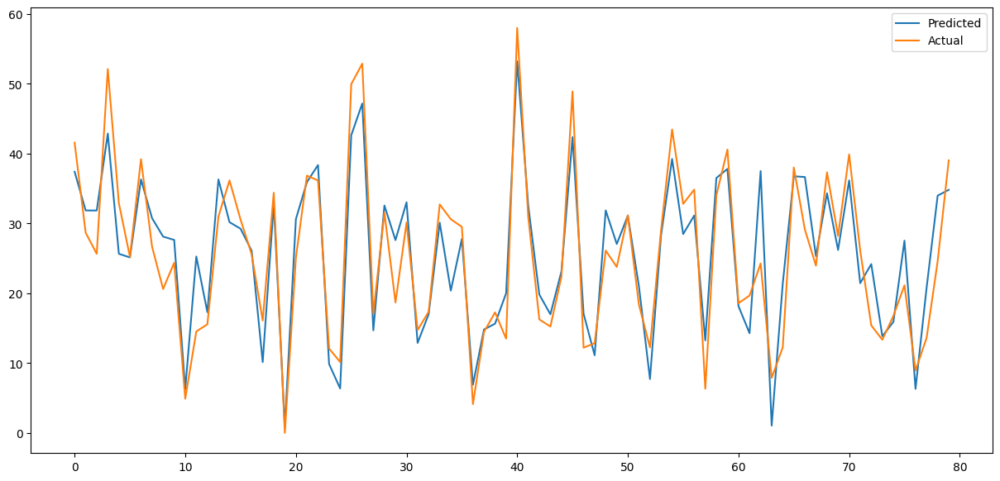

In [54]:
score_metrix(sgd_g,x_train_trans,x_test_trans,y_train,y_test)

<b>Train Test split for Tree Base Models Here we use all independent features because multicollinearty not effecting tree base models. And we are not transforming our dependent variable because distribution of the dependent variable not effect the model accuracy. </b>

In [55]:
tree_df = pd.get_dummies(df, columns = ['Seasons', 'Holiday', 'Functioning Day', 'month', 'year', 'week'], drop_first=True)

Split the data in X and Y

In [56]:
new_x = tree_df.drop(columns= 'Rented Bike Count')
new_y = tree_df['Rented Bike Count']

In [57]:
x_train , x_test, y_train, y_test = train_test_split(new_x, new_y, test_size= 0.25, random_state= 42)

Scaling the data

In [58]:
scale = MinMaxScaler()

In [59]:
x_train_scale = scale.fit_transform(x_train)
x_test_scale = scale.fit_transform(x_test)

Importing all the tree models to train the models

In [60]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor, StackingRegressor
from xgboost import XGBRegressor

All tree based models score without hyperparameter tuning and append them on predefined metrices list

In [61]:
dt = DecisionTreeRegressor()
rf = RandomForestRegressor()
bag = BaggingRegressor()
grad = GradientBoostingRegressor()
xgb = XGBRegressor()

tree = [dt, rf, bag, grad, xgb]
for i in tree:
    i.fit(x_train_scale, y_train)
    y_pred = i.predict(x_test_scale)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test,y_pred)
    ad_r2 =1-(1-r2)*((x_test_scale.shape[0]-1)/(x_test_scale.shape[0]-x_test_scale.shape[1]-1))

    training_score.append(i.score(x_train_scale,y_train))
    mean_absolut_error.append(mae)
    mean_sq_error.append(mse)
    root_mean_sq_error.append(rmse)
    r2_list.append(r2)
    adj_r2_list.append(ad_r2)


Converting all dataframe mertrics to a single dataframe to get the idea of the performace

In [62]:
model_names = ['Linear Regression','Ridge','Lasso','SGD regression','Decision_Tree','Random_Forest','Bagging','Graidient_boost','xg_boost']

all_matrices={'Mean_Absolute_error':mean_absolut_error,'Mean_square_error':mean_sq_error,'Root_Mean_square_error':root_mean_sq_error,'Training_score':training_score,'R2':r2_list,'Adjusted_R2':adj_r2_list}

matrices=pd.DataFrame.from_dict(all_matrices,orient='index',columns=model_names)

In [63]:
# Adjusted R2 score is set in descending order 
matric = matrices.transpose().sort_values("Adjusted_R2",ascending=False).reset_index().rename(columns={'index':'model'})
matric

,model,Mean_Absolute_error,Mean_square_error,Root_Mean_square_error,Training_score,R2,Adjusted_R2
0,Random_Forest,107.443635,32697.229168,180.823752,0.990095,0.920095,0.919097
1,xg_boost,111.269436,33573.220501,183.229966,0.987328,0.917954,0.916930
2,Bagging,117.397169,38792.167790,196.957274,0.984142,0.905200,0.904016
3,Decision_Tree,138.224201,57179.025114,239.121361,1.000000,0.860267,0.858522
4,Graidient_boost,163.413360,63808.949567,252.604334,0.871735,0.844065,0.842117
5,Lasso,4.044736,28.020982,5.293485,0.809057,0.814854,0.810703
6,SGD regression,4.049209,28.290094,5.318843,0.807680,0.813076,0.808885
7,Linear Regression,4.079748,28.330645,5.322654,0.807564,0.812808,0.808611
8,Ridge,5.453423,48.849630,6.989251,0.667818,0.677231,0.669995


visualize the data based on R2 score of all the trained models without the hyperparameter tuning

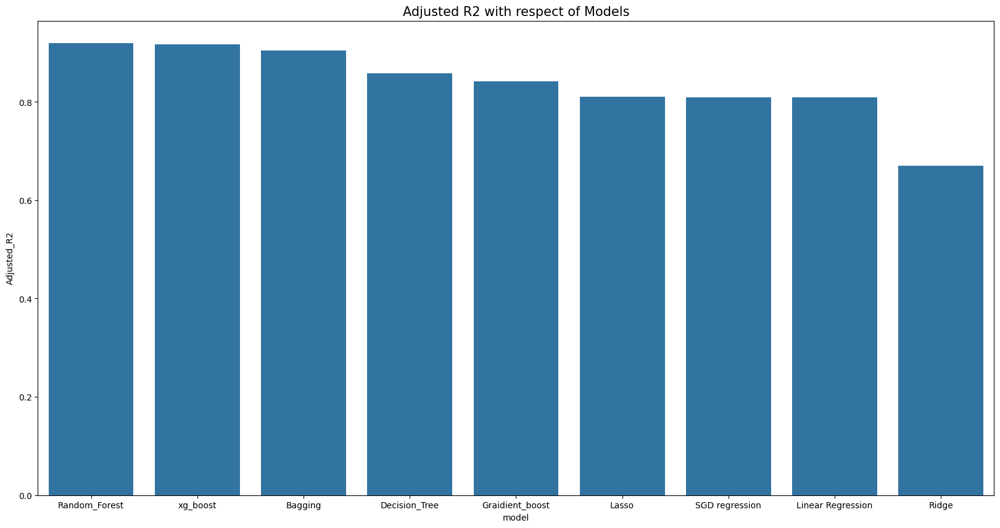

In [64]:
plt.figure(figsize=(20,10))
sns.barplot(y='Adjusted_R2', x = 'model', data=matric)
plt.title("Adjusted R2 with respect of Models",fontsize=15)
plt.show()

Tree basaed models with Hyperparameter Tuning

### Decision Tree with hyperparameter tuning

In [65]:
# Parameters for Decission Tree model
param_grid = {'criterion':['friedman_mse'],#'squared_error', 'absolute_error',],
              'min_samples_leaf':[5],#7,10],
              'max_depth' : [18],#10,25],
              'min_samples_split': [25],#15,35],
              }

# After finding the best parameters, we commented on all the other parameters for faster execution

In [66]:
dt_gs = GridSearchCV(DecisionTreeRegressor(), param_grid = param_grid, cv=5, n_jobs= -1)

****************************** Training score ******************************
Training score  = 0.9364407168630026


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'criterion': 'friedman_mse', 'max_depth': 18, 'min_samples_leaf': 5, 'min_samples_split': 25} 
where model best score is:  0.8611293680180554 



******************** Evalution Matrix ********************
MAE : 135.23416671162923
MSE : 52857.796788795284
RMSE : 229.90823558279786
R2 : 0.8708268089283752
Adjusted R2 :  0.8692136377170274 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


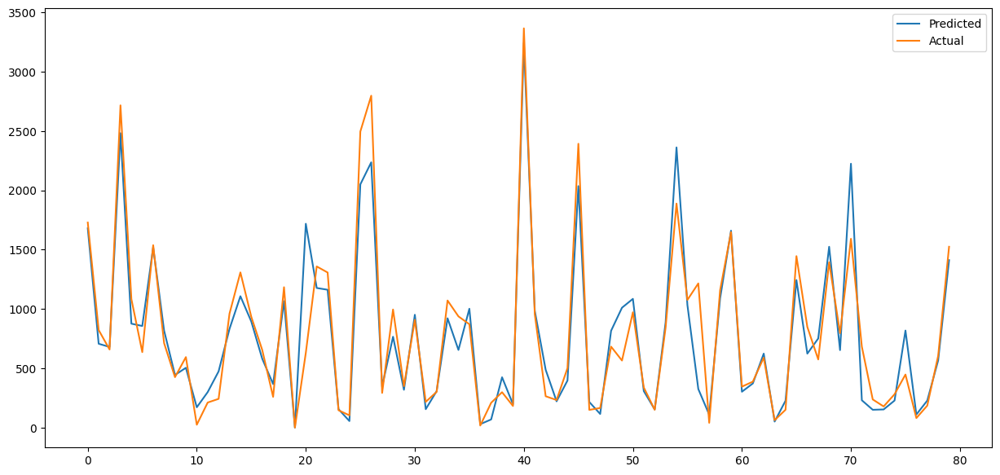

In [67]:
score_metrix(dt_gs, x_train_scale, x_test_scale, y_train, y_test)

In [68]:
!pip install -q -U dtreeviz

In [69]:
import dtreeviz

In [70]:
viz_cmodel = dtreeviz.model(dt_gs.best_estimator_,x_train_scale,y_train, # Passing the model which is best in grid search and pass X_train and y_train
               target_name ='Rented Bike Count', #Dependent variable
               feature_names=x_train.columns, # Taking column names from X_train data frame 
               )
v = viz_cmodel.view(scale=0.3)

### visualization the Tree and saved to the local storage

In [71]:
v.show()
v.save("iris.svg")

### model explainability with lime

In [72]:
model_explainability_lime(dt_gs.best_estimator_, 6, 1)

Intercept 74.36948087524638
Prediction_local [1573.7134356]
Right: 643.8888888888889


### Model explainability with Shap

In [73]:
model_explainability_shap(dt_gs.best_estimator_, 2)

### RandomForestRegressor with hyperparameter tuning

In [74]:
param_grid = {'n_estimators':[150],#100,200],
              'min_samples_leaf':[4],#6,2],
              'max_depth' : [20],#25,30],
              'min_samples_split': [25]
              }

In [75]:
rf_gs = GridSearchCV(RandomForestRegressor(),param_grid=param_grid,n_jobs=-1,cv=5)

****************************** Training score ******************************
Training score  = 0.9436748363587077


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 25, 'n_estimators': 150} 
where model best score is:  0.9026035680399425 



******************** Evalution Matrix ********************
MAE : 123.23363875013098
MSE : 41433.055997324016
RMSE : 203.55111396728836
R2 : 0.8987464407491501
Adjusted R2 :  0.8974819420906057 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


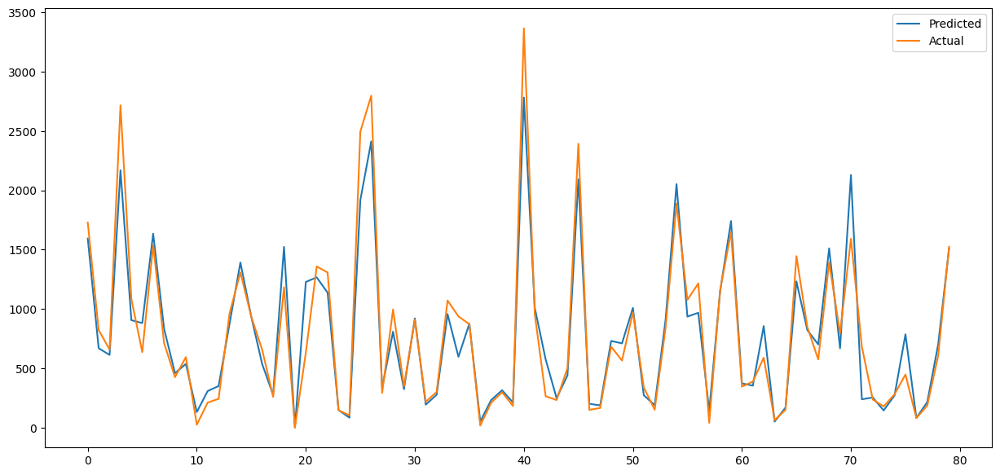

In [76]:
score_metrix(rf_gs, x_train_scale, x_test_scale, y_train, y_test)

### model explainability with lime

In [77]:
model_explainability_lime(rf_gs.best_estimator_,6,2)

Intercept 176.4317080021832
Prediction_local [1535.31802497]
Right: 888.7083302571671


### model explainability with Shap

In [78]:
model_explainability_shap(rf_gs.best_estimator_,2)

### Bagging Regressor with hyperparameter tuning

In [79]:
param_grid = {"n_estimators":[100],
              'max_samples' :[0.3],
              'max_features':[1.0]
              }

In [80]:
b_gs = GridSearchCV(BaggingRegressor(),param_grid=param_grid,n_jobs=-1,cv=5)

****************************** Training score ******************************
Training score  = 0.950601604464694


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'max_features': 1.0, 'max_samples': 0.3, 'n_estimators': 100} 
where model best score is:  0.9031409852484481 



******************** Evalution Matrix ********************
MAE : 124.55600000000001
MSE : 41853.04557981736
RMSE : 204.580169077595
R2 : 0.8977200757115705
Adjusted R2 :  0.8964427593582923 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


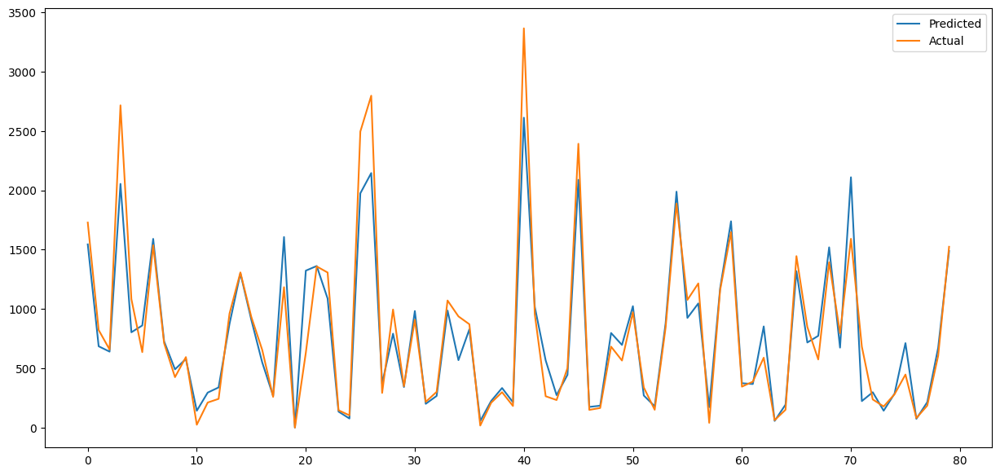

In [81]:
score_metrix(b_gs, x_train_scale, x_test_scale, y_train, y_test)

### model explainability with lime

In [82]:
model_explainability_lime(b_gs.best_estimator_,6,2)

Intercept 250.6269601935595
Prediction_local [1514.77390819]
Right: 933.52


###  GradientBoostingRegressor With Hyperparameter Tuning

In [83]:
params = {'loss':['huber'],
          'min_impurity_decrease':[0.4],
          'criterion':['friedman_mse'],
          'n_estimators': [800],
          'learning_rate':[0.01],
          'min_samples_leaf': [6],
          'max_depth': [25],
          'subsample':[0.7],
          'max_leaf_nodes':[17]}

In [84]:
gb_gs = GridSearchCV(GradientBoostingRegressor(), param_grid = params, n_jobs = -1, cv= 5, verbose=2)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
****************************** Training score ******************************
Training score  = 0.9455791816705285


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'criterion': 'friedman_mse', 'learning_rate': 0.01, 'loss': 'huber', 'max_depth': 25, 'max_leaf_nodes': 17, 'min_impurity_decrease': 0.4, 'min_samples_leaf': 6, 'n_estimators': 800, 'subsample': 0.7} 
where model best score is:  0.9298729196844551 



******************** Evalution Matrix ********************
MAE : 107.16713640298585
MSE : 32141.771489153332
RMSE : 179.28126363107032
R2 : 0.9214523600645229
Adjusted R2 :  0.9204714228405368 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


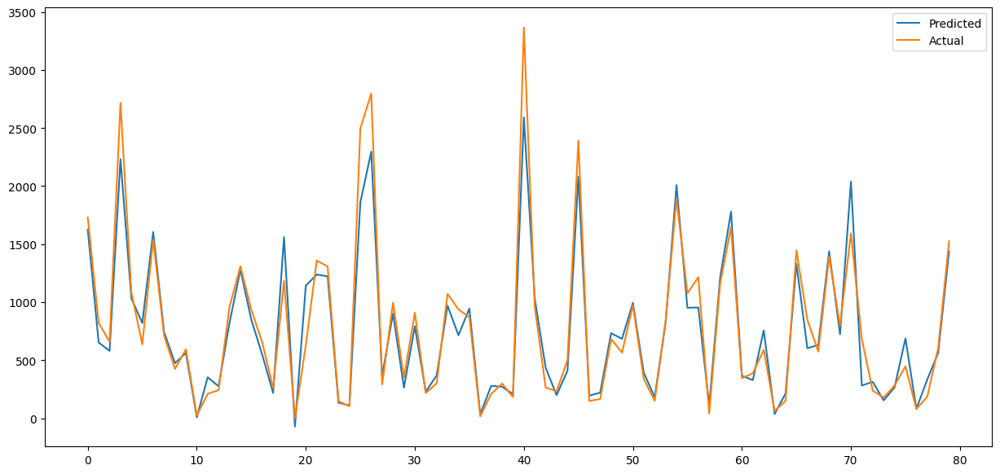

In [85]:
score_metrix(gb_gs,x_train_scale,x_test_scale,y_train,y_test)

In [86]:
model_explainability_shap(rf_gs.best_estimator_,2)

In [87]:
model_explainability_lime(rf_gs.best_estimator_,6,2)

Intercept 176.4317080021832
Prediction_local [1535.31802497]
Right: 888.7083302571671


### XGBRegressor With Hyperparameter Tuning

In [88]:
params = {'subsample': [0.5],
          'n_thread': [4],
          'n_estimators': [1000],
          'min_child_weight': [2],
          'max_depth': [4],
          'learning_rate': [0.02],
          'eval_metric': ['rmse'],
          'colsample_bytree': [0.07]
         }

In [89]:
#creating xgb grid model
xgb_gs= GridSearchCV(XGBRegressor(silent=True),param_grid=params,cv=5)

****************************** Training score ******************************
Training score  = 0.6670427918434143


******************** Best Parameters & Best Score ********************
The best parameters found out to be :{'colsample_bytree': 0.07, 'eval_metric': 'rmse', 'learning_rate': 0.02, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 1000, 'n_thread': 4, 'subsample': 0.5} 
where model best score is:  0.6484240055084228 



******************** Evalution Matrix ********************
MAE : 278.3113367110899
MSE : 142240.3917075451
RMSE : 377.1477054252685
R2 : 0.6523948311805725
Adjusted R2 :  0.6480537860565556 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


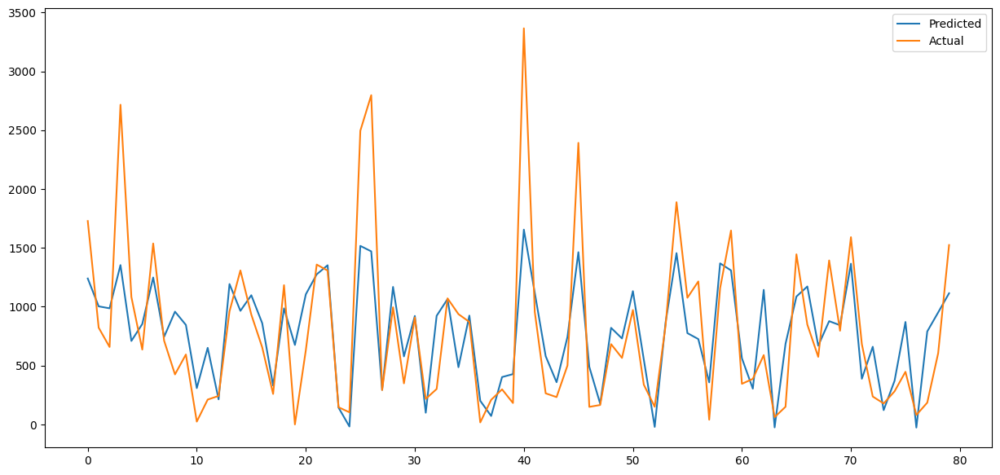

In [90]:
score_metrix(xgb_gs, x_train_scale, x_test_scale, y_train, y_test)

In [91]:
# Calling lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(xgb_gs.best_estimator_,6,2)

Intercept -503.91688680463113
Prediction_local [415.36868915]
Right: 574.21783


### StackingRegressor With Hyperparameter Tuning

In [92]:
from sklearn.ensemble import StackingRegressor

In [93]:
estimators = [('dt',dt_gs.best_estimator_),('rf',rf_gs.best_estimator_),
       ('bg',b_gs.best_estimator_),('xgb',xgb_gs.best_estimator_),
       ]

In [94]:
final_estimator = gb_gs.best_estimator_

In [95]:
stacking=StackingRegressor(estimators=estimators,final_estimator=final_estimator,passthrough=True,n_jobs=-1)

****************************** Training score ******************************
Training score  = 0.9691697646885007


******************** Best Parameters & Best Score ********************
None


******************** Evalution Matrix ********************
MAE : 100.9720857623838
MSE : 30208.857177794434
RMSE : 173.80695376708732
R2 : 0.9261759907270701
Adjusted R2 :  0.9252540442652898 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


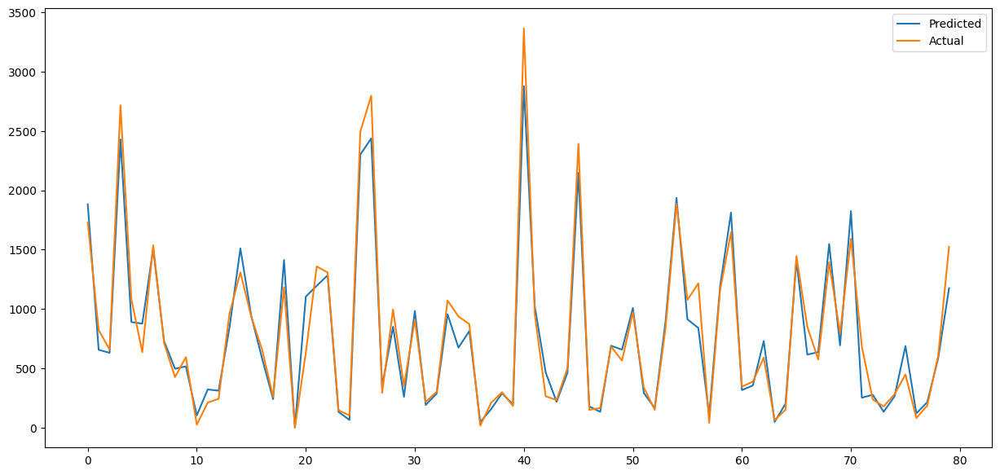

In [96]:
score_metrix(stacking,x_train_scale,x_test_scale,y_train,y_test)

In [97]:
# Calling lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(stacking,6,2)

Intercept 33.22825533924606
Prediction_local [1444.56205139]
Right: 583.3656494385182


In [98]:
#creating dictionary to store all the metrices 
all_matrices={'Mean_Absolute_error':mean_absolut_error_ht,'Mean_square_error':mean_sq_error_ht,'Root_Mean_square_error':root_mean_sq_error_ht,'Training_score':training_score_ht,'R2':r2_list_ht,'Adjusted_R2':adj_r2_list_ht}
#list of all model name 
model_name=['Linear','Lasso','Ridge','Polynomial','Stochastic Gradient Descent','Decision_Tree','Random_Forest','Bagging','Gradient_Boosting','Extreme Gradient Boosting','Stacking Regressor']

In [99]:
mean_absolut_error_ht

[np.float64(196.9485676454761),
 np.float64(195.79664827959766),
 np.float64(195.74506477932243),
 np.float64(107.89713550256268),
 np.float64(4.0485916880848265),
 np.float64(135.23416671162923),
 np.float64(123.23363875013098),
 np.float64(124.55600000000001),
 np.float64(107.16713640298585),
 np.float64(278.3113367110899),
 np.float64(100.9720857623838)]

In [100]:
matrices_df=pd.DataFrame.from_dict(all_matrices,orient='index',columns=model_name)
matrices_df

,Linear,Lasso,Ridge,Polynomial,Stochastic Gradient Descent,Decision_Tree,Random_Forest,Bagging,Gradient_Boosting,Extreme Gradient Boosting,Stacking Regressor
Mean_Absolute_error,196.948568,195.796648,195.745065,107.897136,4.048592,135.234167,123.233639,124.556000,107.167136,278.311337,100.972086
Mean_square_error,82327.582237,82170.428464,82098.667364,32435.153844,28.093766,52857.796789,41433.055997,41853.045580,32141.771489,142240.391708,30208.857178
Root_Mean_square_error,286.927835,286.653848,286.528650,180.097623,5.300355,229.908236,203.551114,204.580169,179.281264,377.147705,173.806954
Training_score,0.807564,0.809056,0.809057,0.942912,0.807638,0.936441,0.943675,0.950602,0.945579,0.667043,0.969170
R2,0.798809,0.799193,0.799368,0.920735,0.814373,0.870827,0.898746,0.897720,0.921452,0.652395,0.926176
Adjusted_R2,0.794298,0.794691,0.794870,0.820010,0.810212,0.869214,0.897482,0.896443,0.920471,0.648054,0.925254


In [101]:
matrices_df = matrices_df.transpose().reset_index().rename(columns= {'index': 'models'})
matrices_df

,models,Mean_Absolute_error,Mean_square_error,Root_Mean_square_error,Training_score,R2,Adjusted_R2
0,Linear,196.948568,82327.582237,286.927835,0.807564,0.798809,0.794298
1,Lasso,195.796648,82170.428464,286.653848,0.809056,0.799193,0.794691
2,Ridge,195.745065,82098.667364,286.528650,0.809057,0.799368,0.794870
3,Polynomial,107.897136,32435.153844,180.097623,0.942912,0.920735,0.820010
4,Stochastic Gradient Descent,4.048592,28.093766,5.300355,0.807638,0.814373,0.810212
5,Decision_Tree,135.234167,52857.796789,229.908236,0.936441,0.870827,0.869214
6,Random_Forest,123.233639,41433.055997,203.551114,0.943675,0.898746,0.897482
7,Bagging,124.556000,41853.045580,204.580169,0.950602,0.897720,0.896443
8,Gradient_Boosting,107.167136,32141.771489,179.281264,0.945579,0.921452,0.920471
9,Extreme Gradient Boosting,278.311337,142240.391708,377.147705,0.667043,0.652395,0.648054


In [104]:
matrices_df = matrices_df.sort_values('Adjusted_R2', ascending=False).reset_index(drop=True)
matrices_df

,models,Mean_Absolute_error,Mean_square_error,Root_Mean_square_error,Training_score,R2,Adjusted_R2
0,Stacking Regressor,100.972086,30208.857178,173.806954,0.969170,0.926176,0.925254
1,Gradient_Boosting,107.167136,32141.771489,179.281264,0.945579,0.921452,0.920471
2,Random_Forest,123.233639,41433.055997,203.551114,0.943675,0.898746,0.897482
3,Bagging,124.556000,41853.045580,204.580169,0.950602,0.897720,0.896443
4,Decision_Tree,135.234167,52857.796789,229.908236,0.936441,0.870827,0.869214
5,Polynomial,107.897136,32435.153844,180.097623,0.942912,0.920735,0.820010
6,Stochastic Gradient Descent,4.048592,28.093766,5.300355,0.807638,0.814373,0.810212
7,Ridge,195.745065,82098.667364,286.528650,0.809057,0.799368,0.794870
8,Lasso,195.796648,82170.428464,286.653848,0.809056,0.799193,0.794691
9,Linear,196.948568,82327.582237,286.927835,0.807564,0.798809,0.794298


visualize the data based on R2 score of all the trained models with the hyperparameter tuning

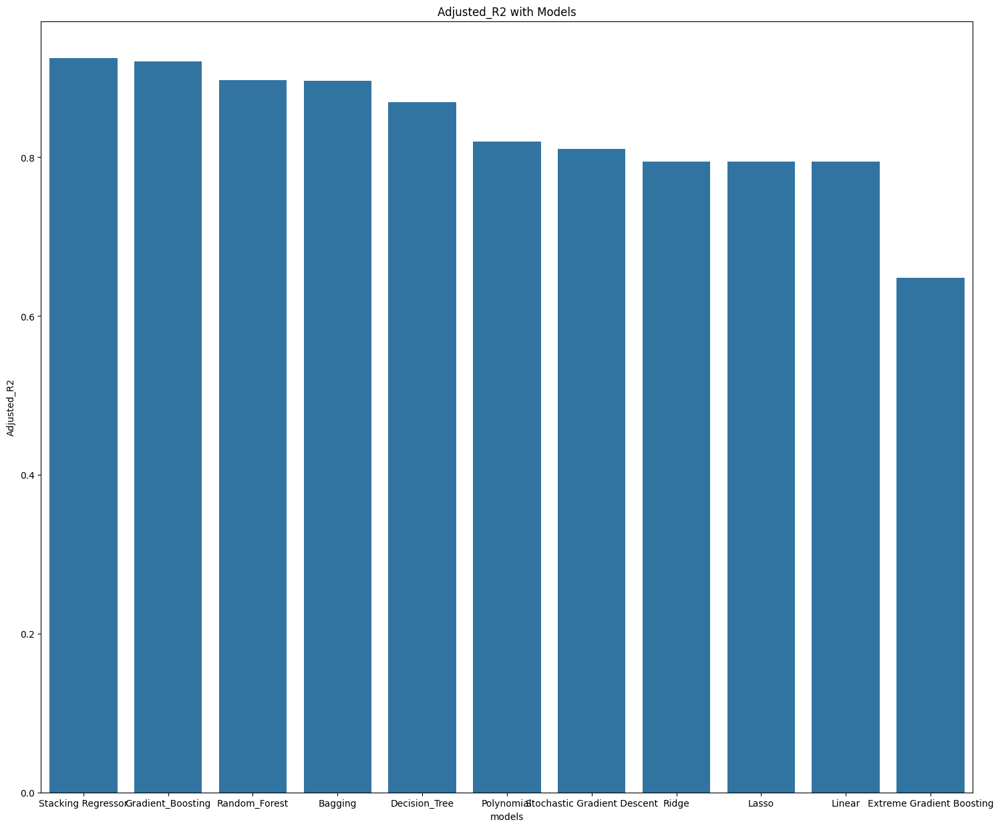

In [109]:
plt.figure(figsize= (18,15))
sns.barplot(y='Adjusted_R2', x = 'models', data=matrices_df)
plt.title('Adjusted_R2 with Models')
plt.show()